In [70]:
%load_ext autoreload
%autoreload 2

import cv2
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import glob
import h5py

import sys
sys.path.append('../../src')
from utils import smooth_curve
from viz import show_images
from PlumeDataset import plume_dataset
from AutoAlign import align_plumes
from Velocity import VelocityCalculator
from PlumeMetrics import PlumeMetrics
from HorizontalLineProfileAnalyzer import HorizontalLineProfileAnalyzer

def visualize_corners(image: np.ndarray, coordinates: np.ndarray, color='k', marker_size=50):
    """
    Visualize corners on the given image using matplotlib, plotting only dots.
    
    Args:
    - image: NumPy array of shape (H, W, C) representing the image
    - coordinates: NumPy array of shape (N, 2) where N is the number of corners,
                   each row contains [x, y] coordinates
    - color: Color of the corner markers (default: 'r' for red)
    - marker_size: Size of the corner markers
    
    Returns:
    - matplotlib Figure object
    """
    fig, ax = plt.subplots()
    ax.imshow(image)
    ax.scatter(coordinates[:, 0], coordinates[:, 1], c=color, s=marker_size, marker='+')
    ax.set_xticks([])
    ax.set_yticks([])

imgs = []


def analyze_function(P, V, plumes, index, viz_index, plume_name, 
                     align_parms={'align':False, 'coords':None, 'coords_standard':None}):
    # plumes = plumes[x_range[0]:x_range[1]]

    # align plumes
    if align_parms['align']:
        if align_parms['coords'] is None or align_parms['coords_standard'] is None:
            raise ValueError('Please provide the coordinates for alignment')
        else:
            plumes = align_plumes(plumes, align_parms['coords'], align_parms['coords_standard'])

    show_images(plumes[index][viz_index], img_per_row=16, img_height=1, title=plume_name)
    plt.show()

    areas, coords, labeled_images = P.calculate_area_for_plumes(plumes, return_format='dataframe')
    df_area = P.to_df(areas)
    print(plumes[index][viz_index].shape, areas[index][viz_index].shape, coords[index][viz_index].shape, labeled_images[index][viz_index].shape)
    P.viz_blob_plume(plumes[index][viz_index], areas[index][viz_index], coords[index][viz_index], labeled_images[index][viz_index], title=f'{plume_name}-Area')

    plume_positions, plume_distances, plume_velocities = V.calculate_distance_area_for_plumes(plumes)
    df_velocity = V.to_df(plume_positions, plume_distances, plume_velocities)
    print(plumes[index][viz_index].shape, plume_positions[index][viz_index].shape, plume_distances[index][viz_index].shape, plume_velocities[index][viz_index].shape)
    V.visualize_plume_positions(plumes[index][viz_index], plume_positions[index][viz_index], label_time=False, title=f'{plume_name}-plume position')

    df = pd.concat([df_velocity, df_area], axis=1)
    return df

threshold = 20
time_interval = 500e-9  # 500ns

# visualize parameters
index = 5
# x_range = (8, 82) # x_range of frames to visualize
viz_index = list(np.arange(0, 32, 1))

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## YG045

['1-SrRuO3', '1-SrRuO3_Pre']


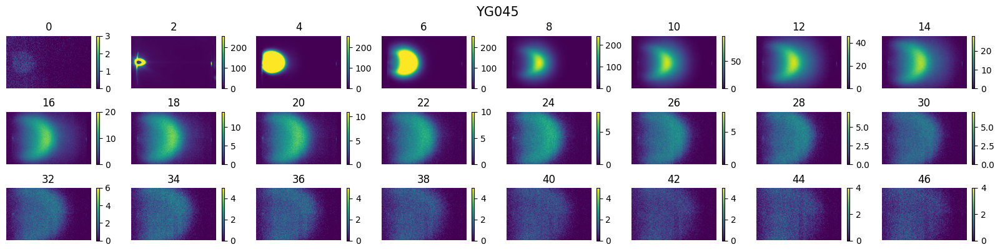

In [2]:
file = '../../datasets/YG045_YichenGuo_JulianGoddy_05092024.h5'

plume_ds = plume_dataset(file_path=file, group_name='PLD_Plumes')
keys = plume_ds.dataset_names()
print(keys)

labels = list(np.arange(0, 48, 2))
ds_name = file.split('/')[-1].split('_')[0]
plumes = plume_ds.load_plumes('1-SrRuO3')
show_images(plumes[5][labels], labels=labels, img_per_row=8, img_height=1, title=ds_name, show_colorbar=True)
plt.show()

In [3]:
frame_view_YG045 = plume_ds.load_plumes('1-SrRuO3_Pre')[2][0]
coords_YG045 = np.array([[30,51], [30,208], [375,43], [377,226]])
# px.imshow(frame_view_YG045)
visualize_corners(frame_view_YG045, coords_YG045, color='k', marker_size=50)

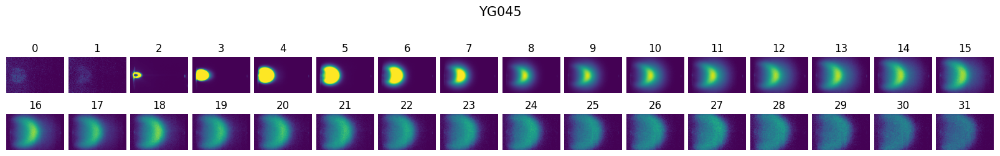

100%|██████████| 156/156 [00:42<00:00,  3.64it/s]


(32, 250, 400) (32,) (32, 2) (32, 250, 400)


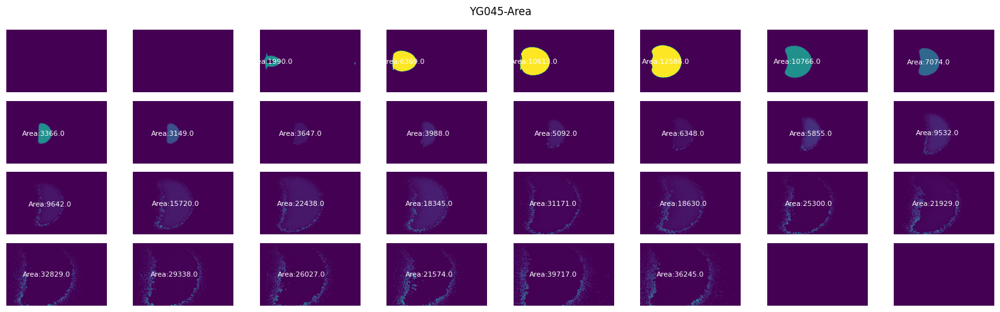

100%|██████████| 156/156 [00:14<00:00, 11.01it/s]


(32, 250, 400) (32, 2) (32,) (32,)


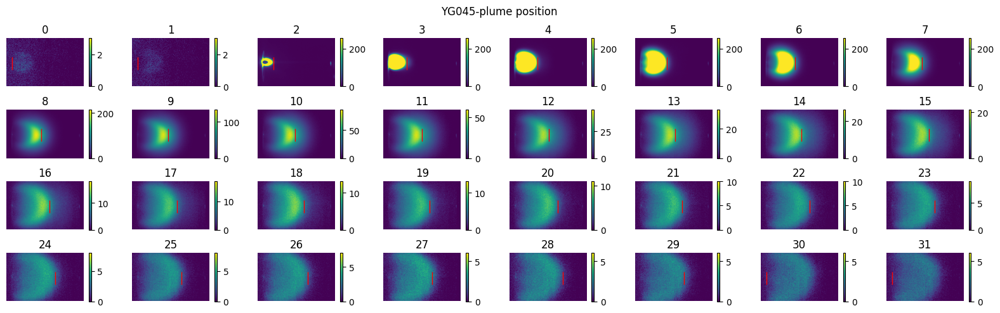

In [4]:
# analysis frame parameters
start_position = (30, (51+208)//2) # start position of plume  (x, y)
position_range = (30, 376) # x position range

P = PlumeMetrics(time_interval, start_position, position_range, threshold=threshold)
V = VelocityCalculator(time_interval, position_range, start_position, threshold=threshold)

df_YG045 = analyze_function(P, V, plumes, threshold, index, viz_index, ds_name, align_parms={'align':False, 'coords':coords_YG045, 'coords_standard':coords_YG045})
df_YG045['Growth'] = ds_name
df_YG045.to_csv('../../datasets/SRO_plume_metrics/YG045_metrics.csv')

In [5]:
# fig, ax = plt.subplots(figsize=(12, 4))
# lineplot = sns.lineplot(x="time_index", y="Velocity", hue="Growth", data=df_YG045)
# plt.title('Plume Velocity')
# plt.show()

# fig, ax = plt.subplots(figsize=(12, 4))
# lineplot = sns.lineplot(x="time_index", y="Area", hue="Growth", data=df_YG045)
# plt.title('Plume Area')
# plt.xlim(0, 32)
# plt.show()

## YG046

['1-SrRuO3', '1-SrRuO3_Pre']


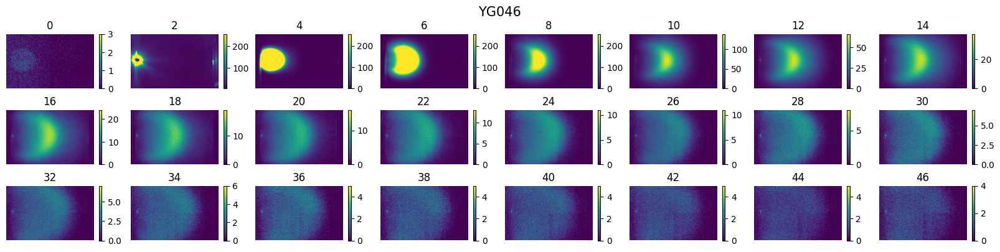

In [31]:
file = '../../datasets/YG046_YichenGuo_05162024.h5'

plume_ds = plume_dataset(file_path=file, group_name='PLD_Plumes')
keys = plume_ds.dataset_names()
print(keys)

labels = list(np.arange(0, 48, 2))
ds_name = file.split('/')[-1].split('_')[0]
plumes = plume_ds.load_plumes('1-SrRuO3')
show_images(plumes[5][labels], labels=labels, img_per_row=8, img_height=1, title=ds_name, show_colorbar=True)
plt.show()

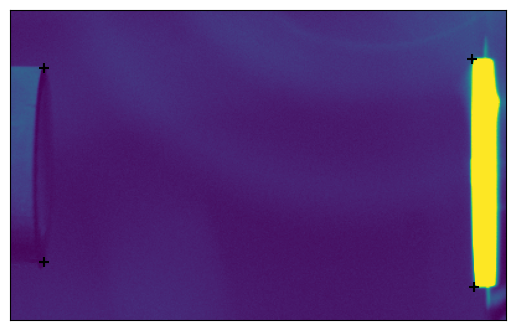

In [35]:
frame_view_YG046 = plume_ds.load_plumes('1-SrRuO3_Pre')[1][1]
coords_YG046 = np.array([[27,46], [27,203], [372,39], [374,223]])
# px.imshow(frame_view_YG046)
visualize_corners(frame_view_YG046, coords_YG046, color='k', marker_size=50)

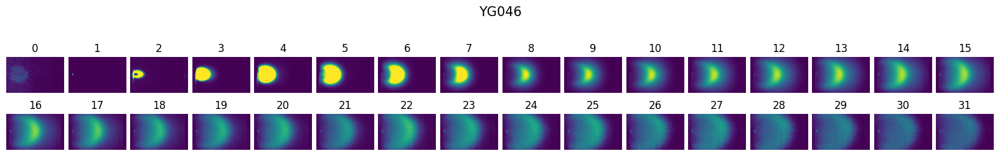

100%|██████████| 125/125 [00:33<00:00,  3.69it/s]


(32, 250, 400) (32,) (32, 2) (32, 250, 400)


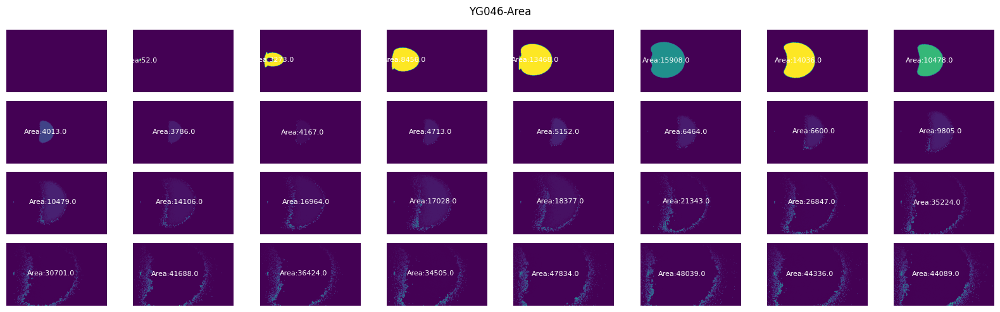

100%|██████████| 125/125 [00:12<00:00,  9.98it/s]


(32, 250, 400) (32, 2) (32,) (32,)


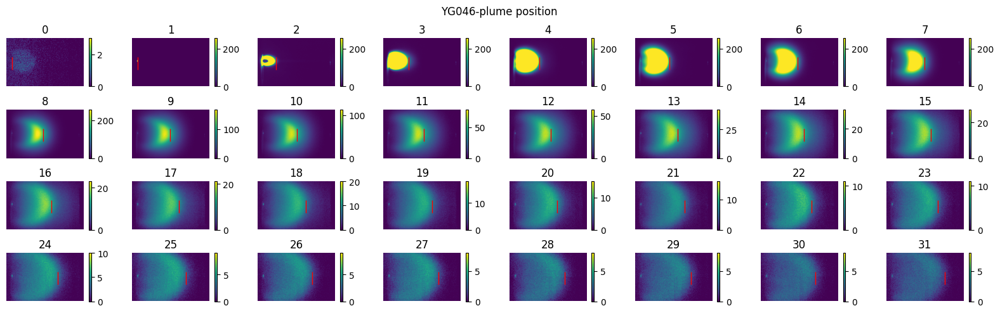

In [8]:
df_YG046 = analyze_function(P, V, plumes, threshold, index, viz_index, ds_name, align_parms={'align':False, 'coords':coords_YG046, 'coords_standard':coords_YG046})
df_YG046['Growth'] = ds_name
df_YG046.to_csv('../../datasets/SRO_plume_metrics/YG046_metrics.csv')

## YG047

['1-SrRuO3', '1-SrRuO3_Pre']


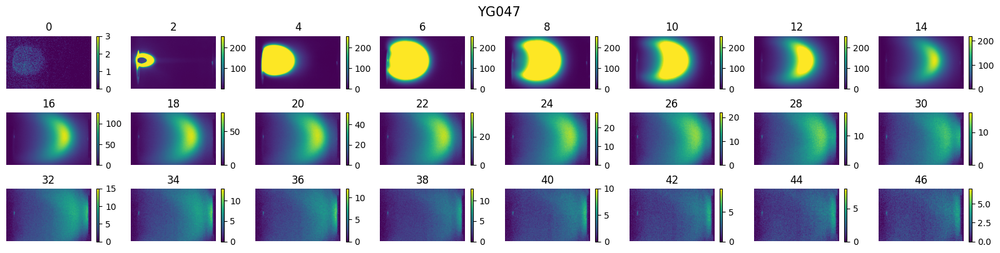

In [36]:
file = '../../datasets/YG047_YichenGuo_05172024.h5'

plume_ds = plume_dataset(file_path=file, group_name='PLD_Plumes')
keys = plume_ds.dataset_names()
print(keys)

labels = list(np.arange(0, 48, 2))
ds_name = file.split('/')[-1].split('_')[0]
plumes = plume_ds.load_plumes('1-SrRuO3')
show_images(plumes[5][labels], labels=labels, img_per_row=8, img_height=1, title=ds_name, show_colorbar=True)
plt.show()

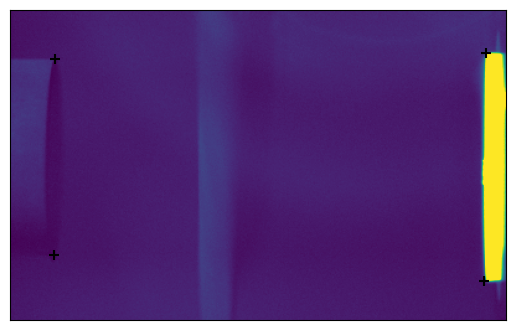

In [37]:
frame_view_YG047 = plume_ds.load_plumes('1-SrRuO3_Pre')[0][0]
coords_YG047 = np.array([[36,39], [35,197], [383,34], [382,218]])
# px.imshow(frame_view_YG047)
visualize_corners(frame_view_YG047, coords_YG047, color='k', marker_size=50)

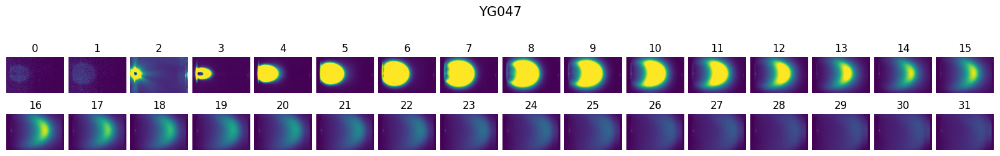

100%|██████████| 94/94 [00:28<00:00,  3.31it/s]


(32, 250, 400) (32,) (32, 2) (32, 250, 400)


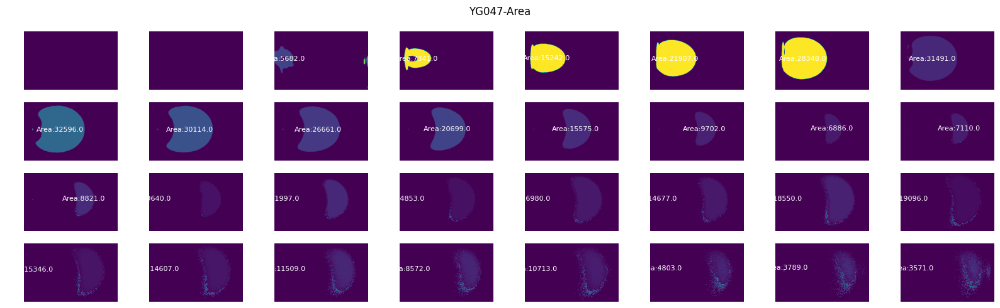

100%|██████████| 94/94 [00:08<00:00, 11.09it/s]


(32, 250, 400) (32, 2) (32,) (32,)


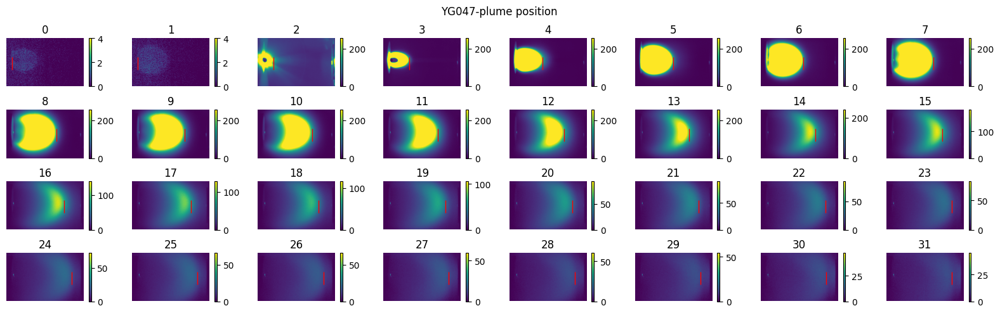

In [38]:
df_YG047 = analyze_function(P, V, plumes, threshold, index, viz_index, ds_name, align_parms={'align':False, 'coords':coords_YG047, 'coords_standard':coords_YG047})
df_YG047['Growth'] = ds_name
df_YG047.to_csv('../../datasets/SRO_plume_metrics/YG047_metrics.csv')

## YG048

['1-SrRuO3', '1-SrRuO3_Pre']


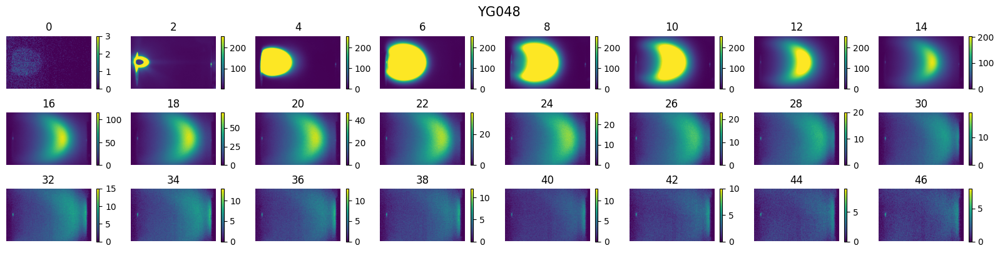

In [39]:
file = '../../datasets/YG048_YichenGuo_05302024.h5'

plume_ds = plume_dataset(file_path=file, group_name='PLD_Plumes')
keys = plume_ds.dataset_names()
print(keys)

labels = list(np.arange(0, 48, 2))
ds_name = file.split('/')[-1].split('_')[0]
plumes = plume_ds.load_plumes('1-SrRuO3')
show_images(plumes[5][labels], labels=labels, img_per_row=8, img_height=1, title=ds_name, show_colorbar=True)
plt.show()

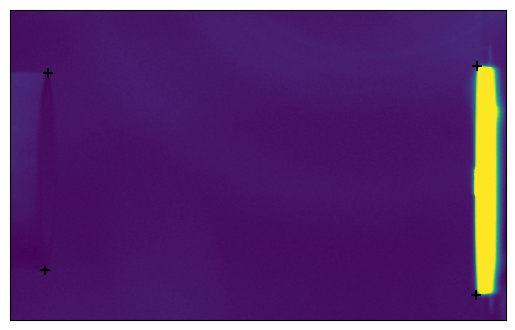

In [40]:
frame_view_YG048 = plume_ds.load_plumes('1-SrRuO3_Pre')[1][1]
coords_YG048 = np.array([[30,50], [28,209], [376,45], [375,229]])
# px.imshow(frame_view_YG048)
visualize_corners(frame_view_YG048, coords_YG048, color='k', marker_size=50)

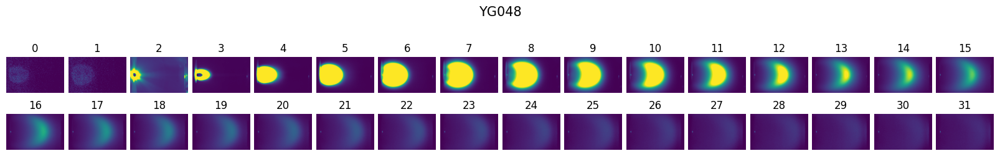

100%|██████████| 189/189 [01:04<00:00,  2.93it/s]


(32, 250, 400) (32,) (32, 2) (32, 250, 400)


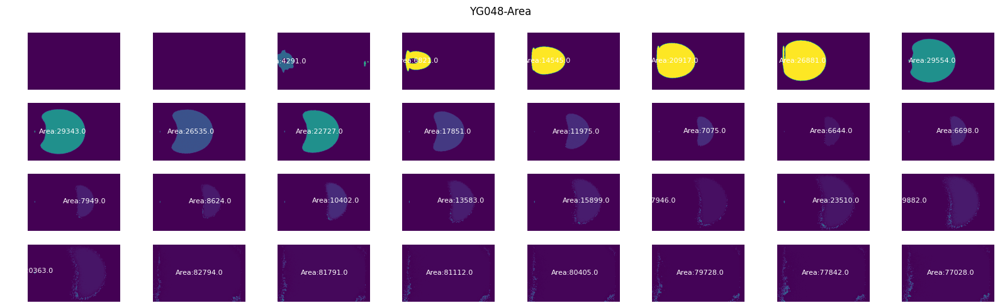

100%|██████████| 189/189 [00:16<00:00, 11.42it/s]


(32, 250, 400) (32, 2) (32,) (32,)


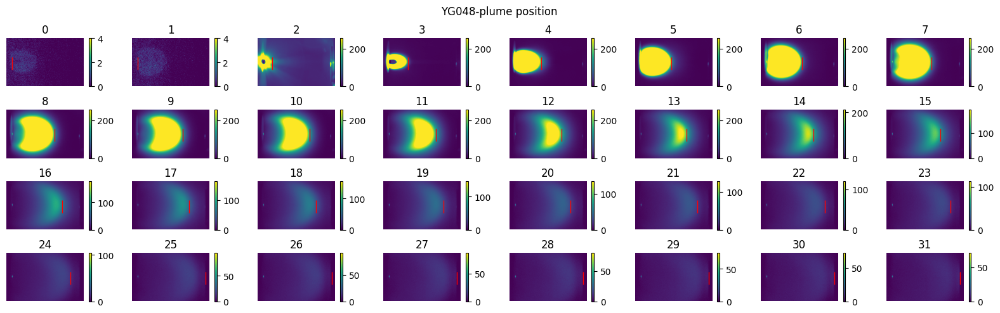

In [41]:
df_YG048 = analyze_function(P, V, plumes, threshold, index, viz_index, ds_name, align_parms={'align':False, 'coords':coords_YG048, 'coords_standard':coords_YG048})
df_YG048['Growth'] = ds_name
df_YG048.to_csv('../../datasets/SRO_plume_metrics/YG048_metrics.csv')

## YG049

['1-SrRuO3', '1-SrRuO3_Pre']


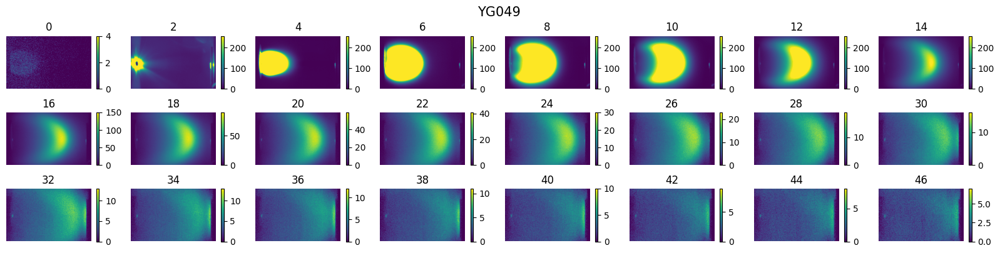

In [42]:
file = '../../datasets/YG049_YichenGuo_06032024.h5'

plume_ds = plume_dataset(file_path=file, group_name='PLD_Plumes')
keys = plume_ds.dataset_names()
print(keys)

labels = list(np.arange(0, 48, 2))
ds_name = file.split('/')[-1].split('_')[0]
plumes = plume_ds.load_plumes('1-SrRuO3')
show_images(plumes[5][labels], labels=labels, img_per_row=8, img_height=1, title=ds_name, show_colorbar=True)
plt.show()

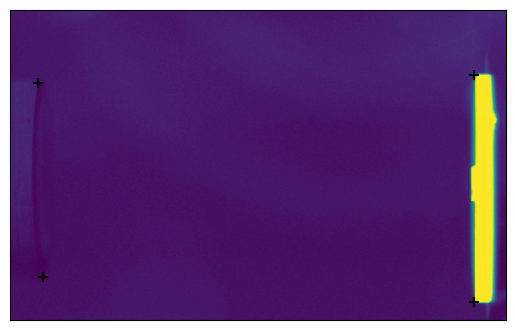

In [43]:
frame_view_YG049 = plume_ds.load_plumes('1-SrRuO3_Pre')[1][1]
coords_YG049 = np.array([[22,58], [26,215], [374,52], [374,235]])
# px.imshow(frame_view_YG049)
visualize_corners(frame_view_YG049, coords_YG049, color='k', marker_size=50)

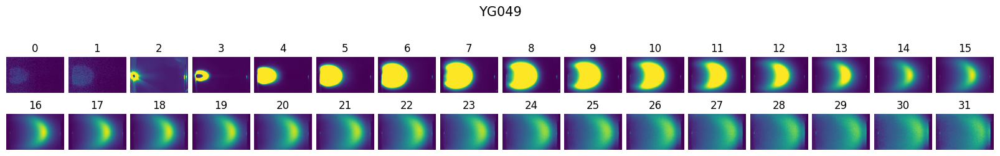

100%|██████████| 459/459 [02:30<00:00,  3.06it/s]


(32, 250, 400) (32,) (32, 2) (32, 250, 400)


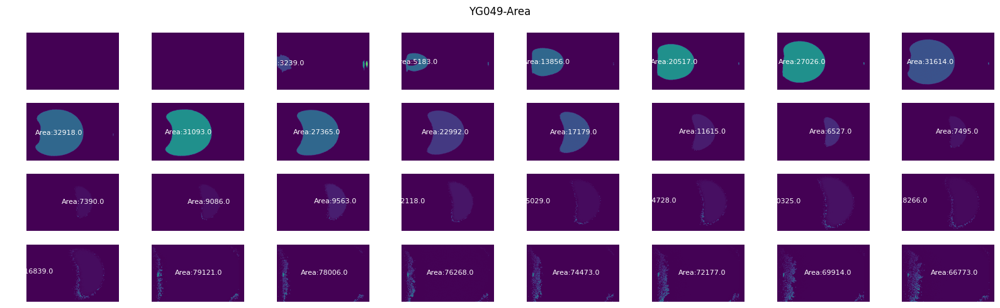

100%|██████████| 459/459 [00:40<00:00, 11.24it/s]


(32, 250, 400) (32, 2) (32,) (32,)


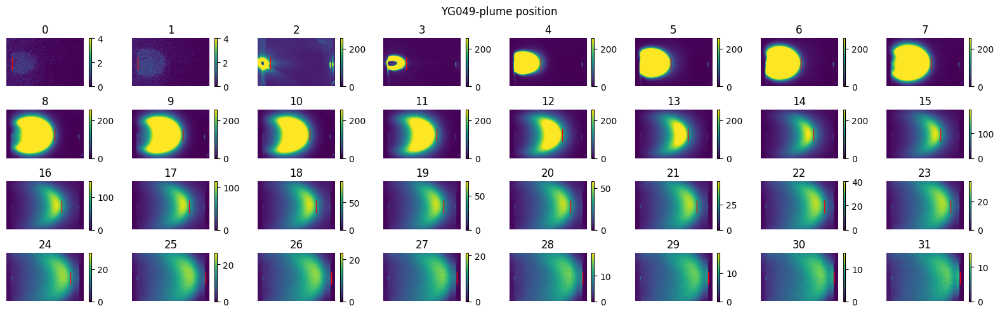

In [44]:
df_YG049 = analyze_function(P, V, plumes, threshold, index, viz_index, ds_name, align_parms={'align':False, 'coords':coords_YG049, 'coords_standard':coords_YG049})
df_YG049['Growth'] = ds_name
df_YG049.to_csv('../../datasets/SRO_plume_metrics/YG049_metrics.csv')

## YG050

['1-SrRuO3', '1-SrRuO3_Pre']


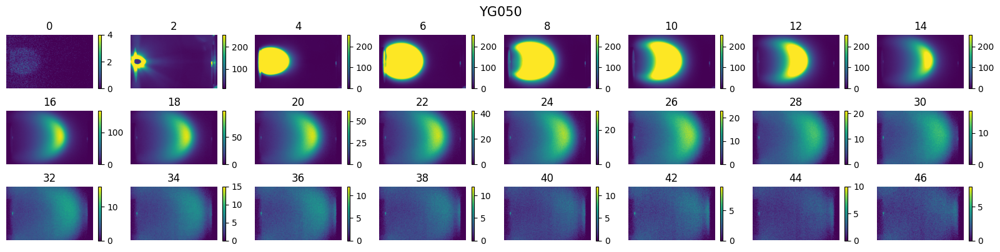

In [60]:
file = '../../datasets/YG050_YichenGuo_06052024.h5'

plume_ds = plume_dataset(file_path=file, group_name='PLD_Plumes')
keys = plume_ds.dataset_names()
print(keys)

labels = list(np.arange(0, 48, 2))
ds_name = file.split('/')[-1].split('_')[0]
plumes = plume_ds.load_plumes('1-SrRuO3')
show_images(plumes[5][labels], labels=labels, img_per_row=8, img_height=1, title=ds_name, show_colorbar=True)
plt.show()

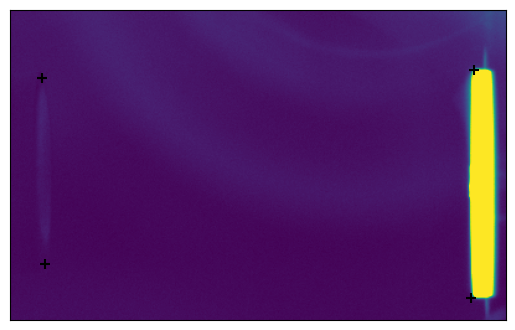

In [61]:
frame_view_YG050 = plume_ds.load_plumes('1-SrRuO3_Pre')[1][1]
coords_YG050 = np.array([[25,54], [28,204], [374,48], [371,232]])
# px.imshow(frame_view_YG050)
visualize_corners(frame_view_YG050, coords_YG050, color='k', marker_size=50)

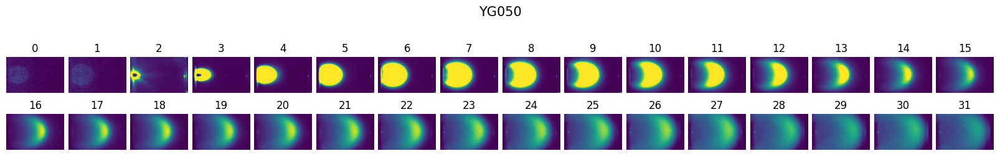

100%|██████████| 189/189 [00:58<00:00,  3.24it/s]


(32, 250, 400) (32,) (32, 2) (32, 250, 400)


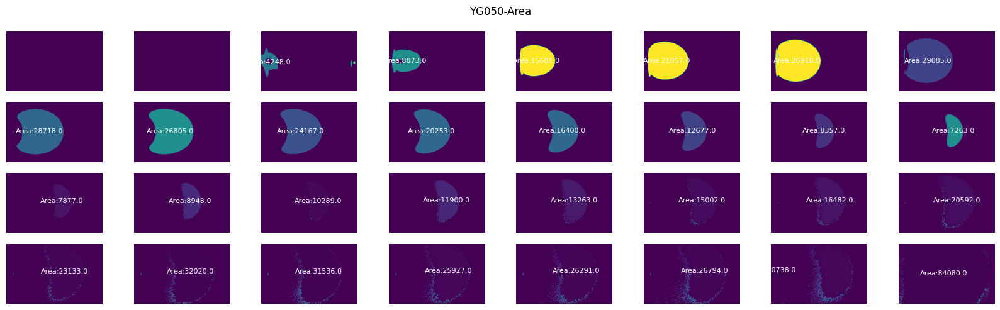

100%|██████████| 189/189 [00:16<00:00, 11.13it/s]


(32, 250, 400) (32, 2) (32,) (32,)


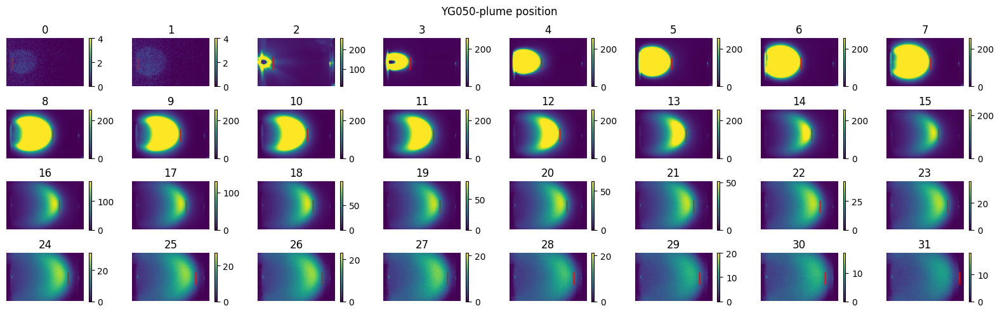

In [62]:
df_YG050 = analyze_function(P, V, plumes, index, viz_index, ds_name, align_parms={'align':False, 'coords':coords_YG050, 'coords_standard':coords_YG050})
df_YG050['Growth'] = ds_name
df_YG050.to_csv('../../datasets/SRO_plume_metrics/YG050_metrics.csv')

## YG051

['1-SrRuO3', '1-SrRuO3_Pre']


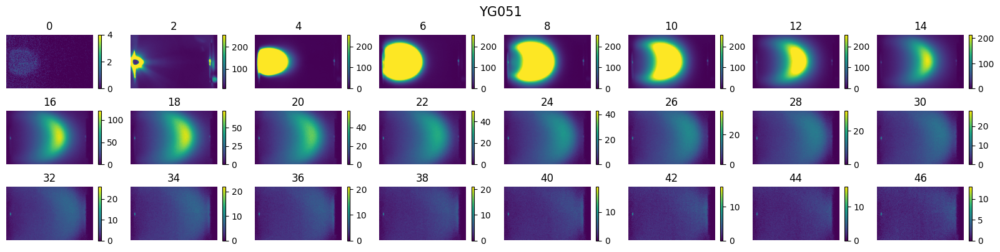

In [48]:
file = '../../datasets/YG051_YichenGuo_06122024.h5'

plume_ds = plume_dataset(file_path=file, group_name='PLD_Plumes')
keys = plume_ds.dataset_names()
print(keys)

labels = list(np.arange(0, 48, 2))
ds_name = file.split('/')[-1].split('_')[0]
plumes = plume_ds.load_plumes('1-SrRuO3')
show_images(plumes[5][labels], labels=labels, img_per_row=8, img_height=1, title=ds_name, show_colorbar=True)
plt.show()

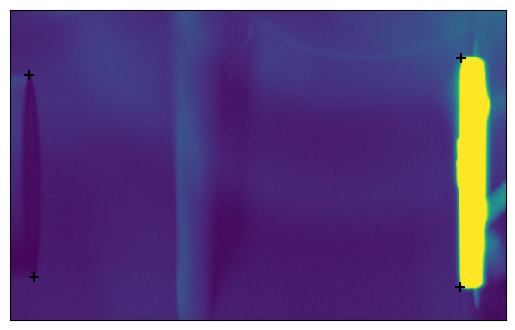

In [49]:
frame_view_YG051 = plume_ds.load_plumes('1-SrRuO3_Pre')[1][1]
coords_YG051 = np.array([[15,52], [19,215], [363,38], [362,223]])
px.imshow(frame_view_YG051)
visualize_corners(frame_view_YG051, coords_YG051, color='k', marker_size=50)

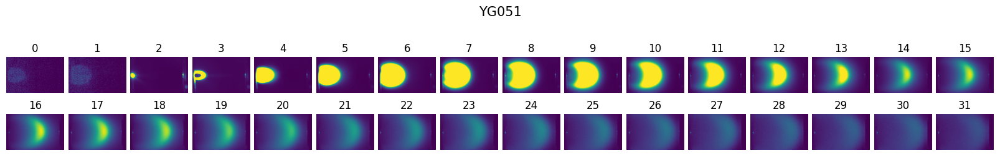

100%|██████████| 189/189 [00:56<00:00,  3.32it/s]


(32, 250, 400) (32,) (32, 2) (32, 250, 400)


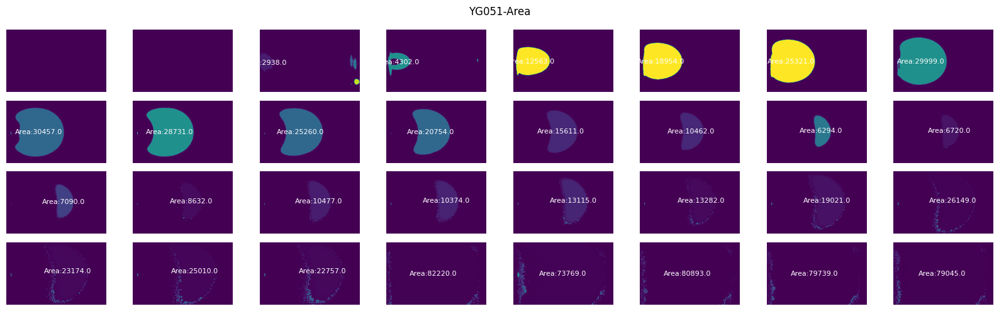

100%|██████████| 189/189 [00:16<00:00, 11.33it/s]


(32, 250, 400) (32, 2) (32,) (32,)


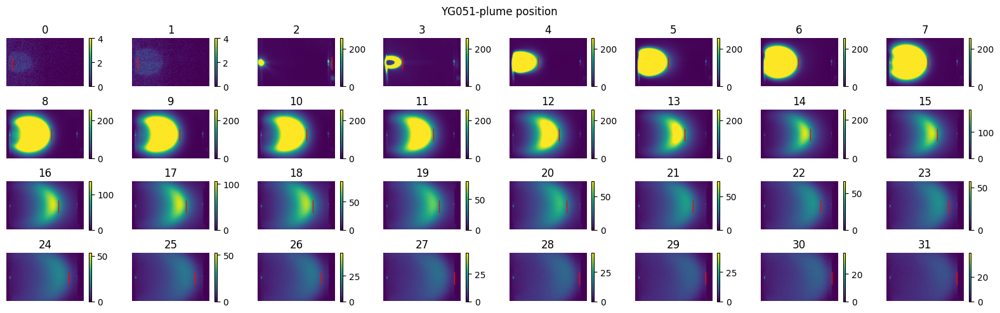

In [50]:
df_YG051 = analyze_function(P, V, plumes, threshold, index, viz_index, ds_name, align_parms={'align':False, 'coords':coords_YG051, 'coords_standard':coords_YG051})
df_YG051['Growth'] = ds_name
df_YG051.to_csv('../../datasets/SRO_plume_metrics/YG051_metrics.csv')

## summary

In [64]:
df_all = pd.concat([df_YG045, df_YG046, df_YG047, df_YG048, df_YG049, df_YG050, df_YG051], axis=0)
df_all

Distance    Velocity     Area Growth
plume_index time_index                                      
0           0                  0         0.0      0.0  YG045
            1                  0         0.0      0.0  YG045
            2                 43  86000000.0   1711.0  YG045
            3                 90  94000000.0   6456.0  YG045
            4                120  60000000.0  11348.0  YG045
...                          ...         ...      ...    ...
188         123              340         0.0      0.0  YG051
            124              340         0.0      0.0  YG051
            125              340         0.0      0.0  YG051
            126              340         0.0      0.0  YG051
            127              340         0.0      0.0  YG051

[179328 rows x 4 columns]

### plot

In [65]:
conditions = ['YG045', 'YG046', 'YG047', 'YG048', 'YG049', 'YG050', 'YG051'] 
df_plot = df_all[df_all['Growth'].isin(conditions)]

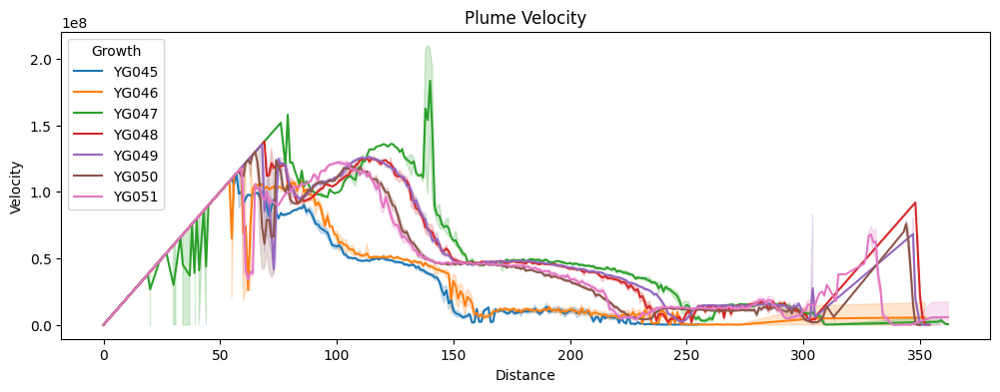

In [66]:
fig, ax = plt.subplots(figsize=(12, 4))
lineplot = sns.lineplot(x="Distance", y="Velocity", hue="Growth", data=df_plot)
plt.title('Plume Velocity')
plt.show()

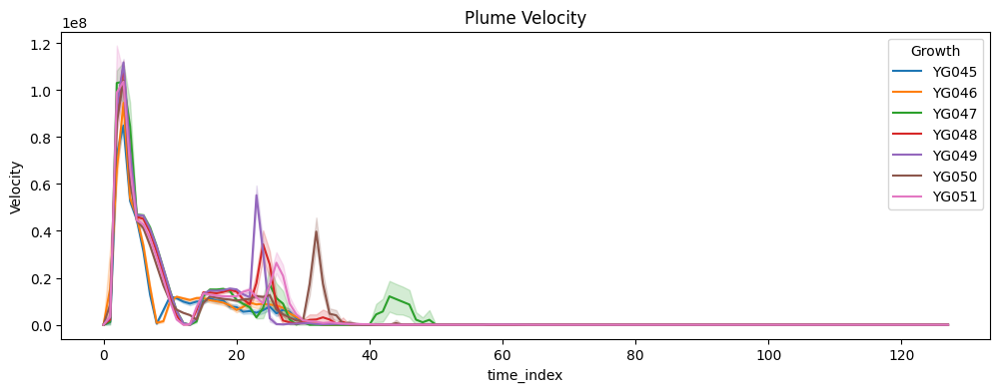

In [67]:
fig, ax = plt.subplots(figsize=(12, 4))
lineplot = sns.lineplot(x="time_index", y="Velocity", hue="Growth", data=df_plot)
plt.title('Plume Velocity')
plt.show()

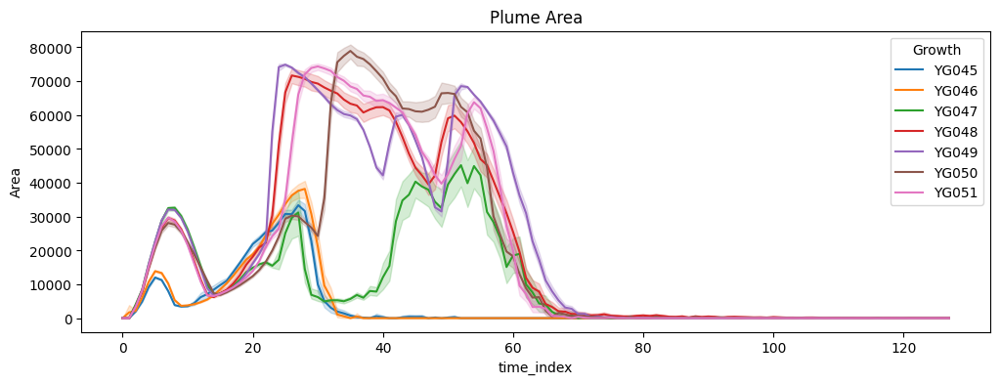

In [68]:
fig, ax = plt.subplots(figsize=(12, 4))
lineplot = sns.lineplot(x="time_index", y="Area", hue="Growth", data=df_plot)
plt.title('Plume Area')
# plt.xlim(0, 32)
plt.show()

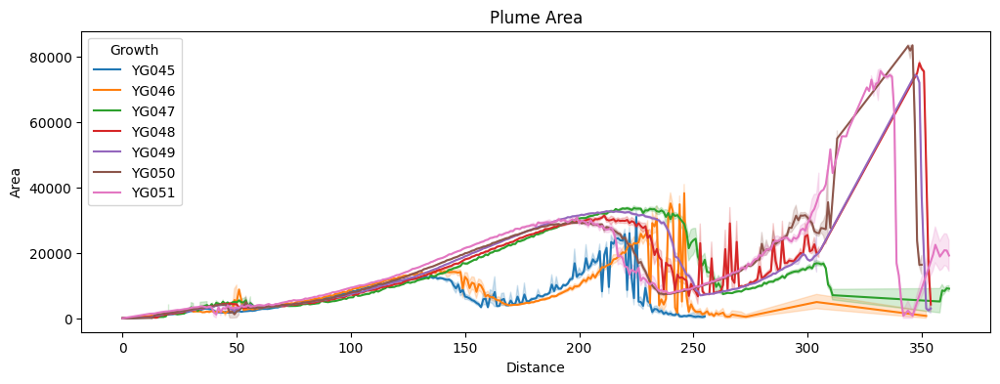

In [69]:
fig, ax = plt.subplots(figsize=(12, 4))
lineplot = sns.lineplot(x="Distance", y="Area", hue="Growth", data=df_plot)
plt.title('Plume Area')
plt.show()